<a href="https://colab.research.google.com/github/maurohrosa/projetos_data_science/blob/main/Panorama_do_COVID_19_no_Brasil.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 3.0**
*by Mauro Rosa*  

---
  

# Panorama do COVID-19

A Covid-19 é uma infecção respiratória aguda causada pelo coronavírus SARS-CoV-2, potencialmente grave, de elevada transmissibilidade e de distribuição global.

O SARS-CoV-2 é um betacoronavírus descoberto em amostras de lavado broncoalveolar obtidas de pacientes com pneumonia de causa desconhecida na cidade de Wuhan, província de Hubei, China, em dezembro de 2019. 

Pertence ao subgênero Sarbecovírus da família Coronaviridae e é o sétimo coronavírus conhecido a infectar seres humanos.

Os coronavírus são uma grande família de vírus comuns em muitas espécies diferentes de animais, incluindo o homem, camelos, gado, gatos e morcegos. Raramente os coronavírus de animais podem infectar pessoas e depois se espalhar entre seres humanos como já ocorreu com o MERS-CoV e o SARS-CoV-2.

Até o momento, não foi definido o reservatório silvestre do SARS-CoV-2.


<center>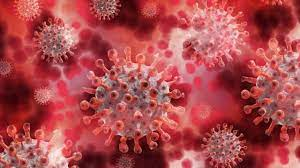</center>

Até o presente momento, estamos com mais de 219 milhões de casos pelo mundo, embora a taxa de mortalidade esteja na casa dos 2%, o volume de obtos é impressionante, 4.5 milhões de pessoas perderam suas vidas para o Covid-19.

Com o objetivo de elevar a consciência situacional a respeito do COVID-19 no Mundo e no Brasil, irei realizar uma análise sobre os dados públicos da doença, e tentar de alguma forma mostrar que, embora pareça, não estamos falando apenas de números, mas sim de vidas.

*fonte:* [Ministério da Saúde](https://www.gov.br/saude/pt-br/coronavirus/o-que-e-o-coronavirus)

## Obtenção dos Dados

*Por se tratar de uma pandemia, a dificuldade de se obter dados confiáveis tornou-se evidente, fake news, dados com distorções, critérios duvidosos e conflitos existentes entre os dados dos governo federal, estaduais e os não oficiais tornaram-se uma realidade.*

*Para este estudo, utilizamos os dados do repositório [OWID](https://ourworldindata.org) (Our World In Data) o site consolida dados de inumeros problemas do mundo, com alto grau de confiabilidade.*

### Importando os dados do COVID-19

* Vamos usar o repositório do Git hub da OWID, no formato CSV.

Vamos importar as bibliotecas necessárias para darmos inicio a nossa analise

In [1]:
!pip install bar_chart_race -q

     |████████████████████████████████| 156 kB 38.2 MB/s 


In [2]:
# importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import bar_chart_race as bcr
import matplotlib.ticker as ticker
from datetime import datetime

%matplotlib inline

#ignorar as warnings
import warnings
warnings.filterwarnings("ignore")

#exibir o vídeo no colab
from IPython.display import HTML

#setando o pandas para enxegarmos todas as colunas do dataframe
pd.get_option('display.max_columns')
pd.get_dummies('display.max_rows',None)

,display.max_rows
0,1


Ler os Dados

*Como estamos lidando com série temporáis, datas, ordem cronologica etc. Deixar a coluna `date` como index torna muito mais fácil brincar com este tipo de informação.*

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv', index_col='date',parse_dates=True)

In [4]:
print(f'Temos: {df.shape[0]} linhas')
print(f'E {df.shape[1]} colunas')

Temos: 121539 linhas
E 64 colunas


In [5]:
# Outra forma de visualizar
print('{:,} linhas'.format(df.shape[0]).replace(',','.'))
print('{} colunas'.format(df.shape[1]))

121.539 linhas
64 colunas


- Cada coluna representa uma variável, neste caso contamos com mais de **60** variáveis, vamos descrever as principais para entender melhor nosso dataframe

### Dicionário de Variáveis
- iso_code - ISO 3166-1 alfa-3 - códigos de países de três letras
- continent - Continente da localização geográfica
- location - Localização geográfica
- date - Data de observação
- total_cases - Total de casos confirmados de COVID-19
- new_cases - Novos casos confirmados de COVID-19
- new_cases_smoothed - Novos casos confirmados de COVID-19 (7 dias suavizados)
- total_deaths - Total de mortes atribuídas à COVID-19
- new_deaths - Novas mortes atribuídas à COVID-19
- new_deaths_smoothed - Novas mortes atribuídas à COVID-19 (7 dias suavizados)
- total_cases_per_million - Total de casos confirmados de COVID-19 por milhão de pessoas
- new_cases_per_million - Novos casos confirmados de COVID-19 por milhão de pessoas de pessoas
- new_cases_smoothed_per_million - Novos casos confirmados de COVID-19 (7 dias suavizados) por milhão de pessoas
- total_deaths_per_million - Total de mortes atribuídas à COVID-19 por milhão de pessoas
- new_deaths_per_million - Novas mortes atribuídas à COVID-19 por milhão de pessoas
- new_deaths_smoothed_per_million - Novas mortes atribuídas à COVID-19 (7 dias suavizados) por milhão de pessoas
- reproduction_rate - Estimativa em tempo real da taxa de reprodução efetiva da COVID-19
- icu_patients - Número de pacientes COVID-19 em UTIs em um determinado dia
- icu_patients_per_million - Número de pacientes COVID-19 em UTIs em um determinado dia por milhão de pessoas
- hosp_patients - Número de pacientes da COVID-19 no hospital em um determinado dia
- hosp_patients_per_million - Número de pacientes COVID-19 no hospital em um determinado dia por milhão de pessoas
- weekly_icu_admissions - Número de pacientes COVID-19 recém admitidos em UTIs em uma determinada semana
- weekly_icu_admissions_per_million - Número de pacientes COVID-19 recém admitidos em UTIs em uma determinada semana por milhão de pessoas
- weekly_hosp_admissions - Número de pacientes COVID-19 recém admitidos em hospitais em uma determinada semana
- weekly_hosp_admissions_per_million - Número de pacientes COVID-19 recém admitidos em hospitais em uma determinada semana por milhão de pessoas
- total_tests - Testes totais para a COVID-19
- new_tests - Novos testes para a COVID-19 (calculados para dias consecutivos)
- total_tests_per_thousand - Testes totais para COVID-19 por mil pessoas
- new_tests_per_thousand - Novos testes de COVID-19 por mil pessoas
- new_tests_smoothed - Novos testes para a COVID-19 (7 dias suavizados) média móvel de 7 dias para casos não enviados.
- new_tests_smoothed_per_thousand - Novos testes para COVID-19 (7 dias suavizados) por mil pessoas
- positive_rate - A parte dos testes COVID-19 que são positivos, dada como média móvel de 7 dias (inverso dos tests_per_case)
- tests_per_case - Testes realizados por novo caso confirmado de COVID-19, dado como uma média móvel de 7 dias (este é o inverso de positive_rate)
- tests_units - Unidades utilizadas pelo local para relatar seus dados de teste
- total_vaccinations - Número total de doses de vacinação COVID-19 administradas
- people_vaccinated - Número total de pessoas que receberam pelo menos uma dose de vacina
- people_fully_vaccinated - Número total de pessoas que receberam todas as doses prescritas pelo protocolo de vacinação
- new_vaccinations - Novas doses de vacinação COVID-19 administradas (apenas calculadas para dias consecutivos)
- new_vaccinations_smoothed - Novas doses de vacinação COVID-19 administradas (7 dias suavizadas). Para países que não reportam dados de vacinação diariamente.
- total_vaccinations_per_hundred - Número total de doses de vacinação COVID-19 administradas por 100 pessoas na população total
- people_vaccinated_per_hundred - Número total de pessoas que receberam pelo menos uma dose de vacina por 100 pessoas na população total
- people_fully_vaccinated_per_hundred - Número total de pessoas que receberam todas as doses prescritas pelo protocolo de vacinação por 100 pessoas na população total
- new_vaccinations_smoothed_per_million - Novas doses de vacinação COVID-19 administradas (7 dias suavizadas) por 1.000.000 de pessoas na população total
- stringency_index - Índice de Estringência de Resposta do Governo: medida composta baseada em 9 indicadores de resposta, incluindo fechamento de escolas, fechamento de locais de trabalho e proibição de viagens, redimensionada para um valor de 0 a 100 (100 = resposta mais estrita)
- population - Population in 2020
- population_density - Número de pessoas dividido por área de terreno, medido em quilômetros quadrados, ano mais recente disponível
- median_age - Idade média da população, projeção da ONU para 2020
- aged_65_older - Parte da população com 65 anos de idade ou mais, ano mais recente disponível
- aged_70_older - Participação da população com 70 anos de idade ou mais em 2015
- gdp_per_capita - Produto interno bruto em paridade de poder de compra (dólar internacional constante em 2011), ano mais recente disponível
- extreme_poverty - Participação da população vivendo em extrema pobreza, ano mais recente disponível desde 2010
- cardiovasc_death_rate - Taxa de mortalidade por doença cardiovascular em 2017 (número anual de mortes por 100.000 pessoas)
- diabetes_prevalence - Prevalência do diabetes (% da população de 20 a 79 anos de idade) em 2017
- female_smokers - Participação de mulheres que fumam, ano mais recente disponível
- male_smokers - Participação de homens que fumam, ano mais recente disponível
- handwashing_facilities - Parte da população com instalações básicas de lavagem de mãos nas instalações, o ano mais recente disponível
- hospital_beds_per_thousand - Leitos hospitalares por 1.000 pessoas, o ano mais recente disponível desde 2010
- life_expectancy - Expectativa de vida ao nascer em 2019
- human_development_index - Um índice composto que mede o desempenho médio em três dimensões básicas do desenvolvimento humano - uma vida longa e saudável, conhecimento e um padrão de vida decente.*

## Análise Exploratória dos Dados
- Vamos conhecer nosso dataframe

In [6]:
df.head(2)

,iso_code,continent,location,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-24,AFG,Asia,Afghanistan,5.0,5.0,NaN,NaN,NaN,NaN,0.126,0.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2020-02-25,AFG,Asia,Afghanistan,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [7]:
df.columns

Index(['iso_code', 'continent', 'location', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       'total_vac

### Tipo dos Dados

*Vamos conhecer nossos dados, entender os tipos de dados de cada coluna/variável, se temos todos os dados...*

In [8]:
pd.set_option('display.max_rows', None) #Mostrar todas as linhas do dataframe
pd.DataFrame(df.dtypes, columns=['Tipo Dos Dados'])

,Tipo Dos Dados
iso_code,object
continent,object
location,object
total_cases,float64
new_cases,float64
new_cases_smoothed,float64
total_deaths,float64
new_deaths,float64
new_deaths_smoothed,float64
total_cases_per_million,float64


### Dados Ausentes

* Vamos verificar se temos dados ausentes

In [9]:
(df.isnull().sum() / df.shape[0]).round(2).sort_values(ascending=False)

weekly_icu_admissions                      0.99
weekly_icu_admissions_per_million          0.99
total_boosters                             0.98
total_boosters_per_hundred                 0.98
weekly_hosp_admissions_per_million         0.98
weekly_hosp_admissions                     0.98
excess_mortality                           0.96
excess_mortality_cumulative_per_million    0.96
excess_mortality_cumulative                0.96
excess_mortality_cumulative_absolute       0.96
icu_patients_per_million                   0.89
icu_patients                               0.89
hosp_patients_per_million                  0.87
hosp_patients                              0.87
new_vaccinations                           0.81
people_fully_vaccinated                    0.81
people_fully_vaccinated_per_hundred        0.81
people_vaccinated_per_hundred              0.78
people_vaccinated                          0.78
total_vaccinations_per_hundred             0.77
total_vaccinations                      

* Grande parte das variáveis possui dados ausentes, que não é bom á principio. Mas se tratando de dados ausentes, muitas vezes o que parece um problema acaba não sendo, por isso vamos seguir em frente, entender o caminho de nossa analise e ver se de fato temos um problema ou não.

In [10]:
df.head(4)

,iso_code,continent,location,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-24,AFG,Asia,Afghanistan,5.0,5.0,NaN,NaN,NaN,NaN,0.126,0.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2020-02-25,AFG,Asia,Afghanistan,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2020-02-26,AFG,Asia,Afghanistan,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2020-02-27,AFG,Asia,Afghanistan,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [11]:
df.continent.unique()

array(['Asia', nan, 'Europe', 'Africa', 'North America', 'South America',
       'Oceania'], dtype=object)

In [12]:
# Vamos ver até quando nossos dados estão atualizados
df.index.max()

Timestamp('2021-10-05 00:00:00')

In [13]:
# Vamos selecionar uma data de corte para nossa analise
df.loc[df.index == '2021-09-19'].groupby(['location'])['total_deaths'].sum().sort_values(ascending=False).head(10)

location
World             4692529.0
Europe            1207601.0
South America     1146813.0
Asia              1101909.0
North America     1028209.0
European Union     764422.0
United States      674441.0
Brazil             590752.0
India              445133.0
Mexico             271503.0
Name: total_deaths, dtype: float64

##Iniciando as analises

*Primeiro vamos entender o cenário atual de Covid-19 qual o patamar de casos e mortes pelo mundo.*
*Ponto super relevante, o dataset é cumulativo e temos uma localidade `word`  que soma todas as localidades.*

In [ ]:
#!pip install -U plotly

In [ ]:
#pd.options.plotting.backend = 'plotly'

### Visão global

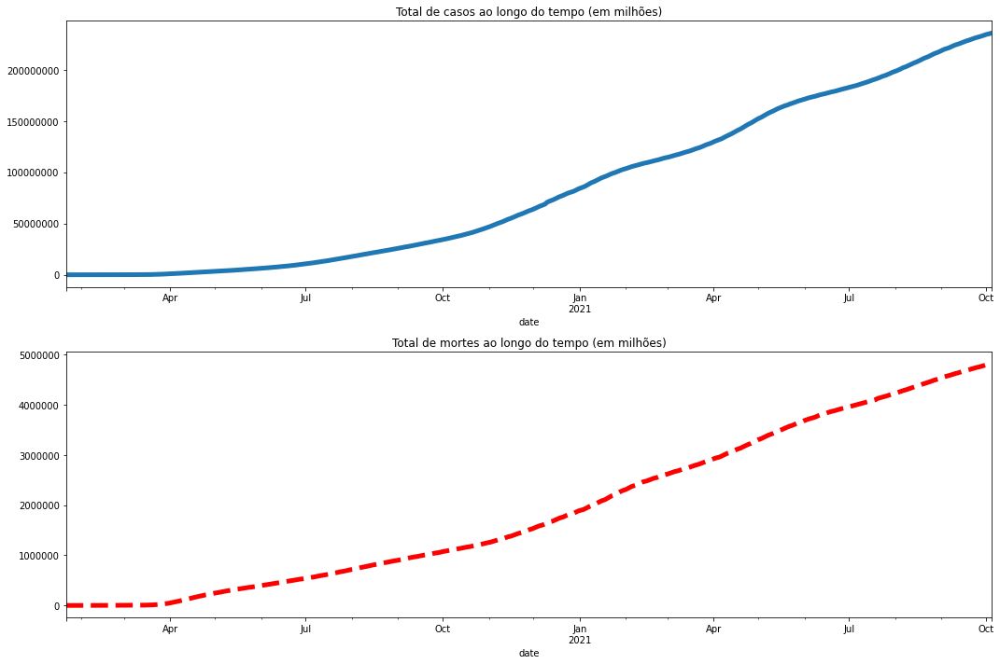

In [14]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(15,10))

#primeira linha0
df.loc[df.location == 'World', 'total_cases'].plot(kind='line',linestyle='-', linewidth=5.0, ax=ax1)
ax1.set_title('Total de casos ao longo do tempo (em milhões)')
ax1.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

#segunda linha
df.loc[df.location == 'World', 'total_deaths'].plot(kind='line',linestyle='--', color='red',linewidth=5.0, ax=ax2)
ax2.set_title('Total de mortes ao longo do tempo (em milhões)')
ax2.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))
plt.tight_layout()

*Infelizmente podemos observar que a curva que casos ao longo do tempo só cresceu, levando a curva de mortes ao mesmo ``shape`` , ambas crescente.*

*Vamos acompanhar de uma forma mais dinâmica, como os paises se comportaram no total de **mortes** ao longo do tempo.*

Como identificamos acima, temos dados consolidadores no Dataset, como exemplo ``World`` , vamos remover-los afim de pegarmos os dados dos paises mais limpos, sem correr o risco de duplicidade

In [15]:
# df_paises = df.loc[df.location != 'World']

In [ ]:
df_paises = df[~df['continent'].isna()]

In [ ]:
top = df_paises.loc['2021-09-14'][['location','total_deaths']].sort_values(
    by='total_deaths',ascending=False)[:15]

In [ ]:
top_localidades = top['location'].reset_index()
top_localidades= top_localidades.drop('date',axis=1)

In [ ]:
top_list = top_localidades.location.tolist()

In [ ]:
top_list

['United States',
 'Brazil',
 'India',
 'Mexico',
 'Peru',
 'Russia',
 'Indonesia',
 'United Kingdom',
 'Italy',
 'Colombia',
 'France',
 'Iran',
 'Argentina',
 'Germany',
 'Spain']

In [ ]:
dados_bar_chart = df_paises.pivot_table(index='date',columns='location',values='total_deaths')

In [ ]:
dados_bar_chart.columns

Index(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria',
       ...
       'United Kingdom', 'United States', 'Uruguay', 'Uzbekistan', 'Vanuatu',
       'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe'],
      dtype='object', name='location', length=186)

In [ ]:
dados_bar_chart_top = dados_bar_chart.loc[: , ['United States',
 'Brazil',
 'India',
 'Mexico',
 'Peru',
 'Russia',
 'Indonesia',
 'United Kingdom',
 'Italy',
 'Colombia',
 'France',
 'Iran',
 'Argentina',
 'Germany',
 'Spain']]

In [ ]:
dados_bar_chart_top.fillna(value=0, inplace= True)

In [ ]:
dados_bar_chart_top.isnull().sum()

location
United States     0
Brazil            0
India             0
Mexico            0
Peru              0
Russia            0
Indonesia         0
United Kingdom    0
Italy             0
Colombia          0
France            0
Iran              0
Argentina         0
Germany           0
Spain             0
dtype: int64

In [ ]:
# Infelizmente está demorando demais o bar chart race
# bcr.bar_chart_race(df=dados_bar_chart_top, filename=None)

In [ ]:
# criando o plot customizado
bcr.bar_chart_race(
    df=dados_bar_chart_top, # selecionando os dados
    filename=None, # nomeando o arquivo
    orientation='h', # orientação do gráfico
    sort='desc', # organização 
    n_bars=10, # número de barras
    fixed_order=False, # ordem fixa
    fixed_max=True, # máximo fixo
    steps_per_period=10, # stepos por período
    interpolate_period=False, # interpolar o período
    label_bars=True, # colocar labels nas barras
    bar_size=.95, # tamanho da barra
    period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'}, # labels dos períodos
    period_fmt='%B %d, %Y', # formato do período
    period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Total Mortes: {v.nlargest(6).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Courier New'}, # resumo do período
    #perpendicular_bar_func='median', # função da barra perpendicular
    period_length=500,# tamanho do período
    figsize=(5, 3), # tamanho da período
    dpi=144, 
    cmap='dark12', # esquema de cores
    title='Mortes por COVID-19 ao longo do tempo', # título
    title_size='', # tamamnho do título
    bar_label_size=7, # tamanho do label das barras
    tick_label_size=7, # tamanho do tick do label
    shared_fontdict={'family' : 'DejaVu Sans', 'color' : '.1'}, # definindo a fonte
    scale='linear', # escala dos dados
    writer=None, # escrever no plot
    fig=None, # definir a figura
    bar_kwargs={'alpha': .7}, # kwargs
    filter_column_colors=False)  # filtrar cores das colunas

Iremos criar uma função para adicionar os rótulos de dados nos gráficos, semelhante ao que fazemos normalmente no excel da vida.
Confesso que nunca tinha visto desta forma, então, peguei como boas práticas de um colega

In [ ]:
#definindo uma função para colocar os rótulos de dados em cima de cada barra
def addlabels(x,y,eixo):
  for i in range(len(x)):
    if eixo == 0:
      #se for do primeiro gráfico temos de adicionar um valor maior para o Y, porque existem mais casos do que mortes
      ax[eixo].text(i,y[i] + 1000000,'{:,}'.format(int(y[i])).replace(',','.'),ha='center',fontsize=15)
    else:
      #se for do segundo gráfico temos de adicionar um valor menor para o Y, porque existem menos mortes do que casos de COVID-19
      ax[eixo].text(i,y[i] + 20000,'{:,}'.format(int(y[i])).replace(',','.'),ha='center',fontsize=15)

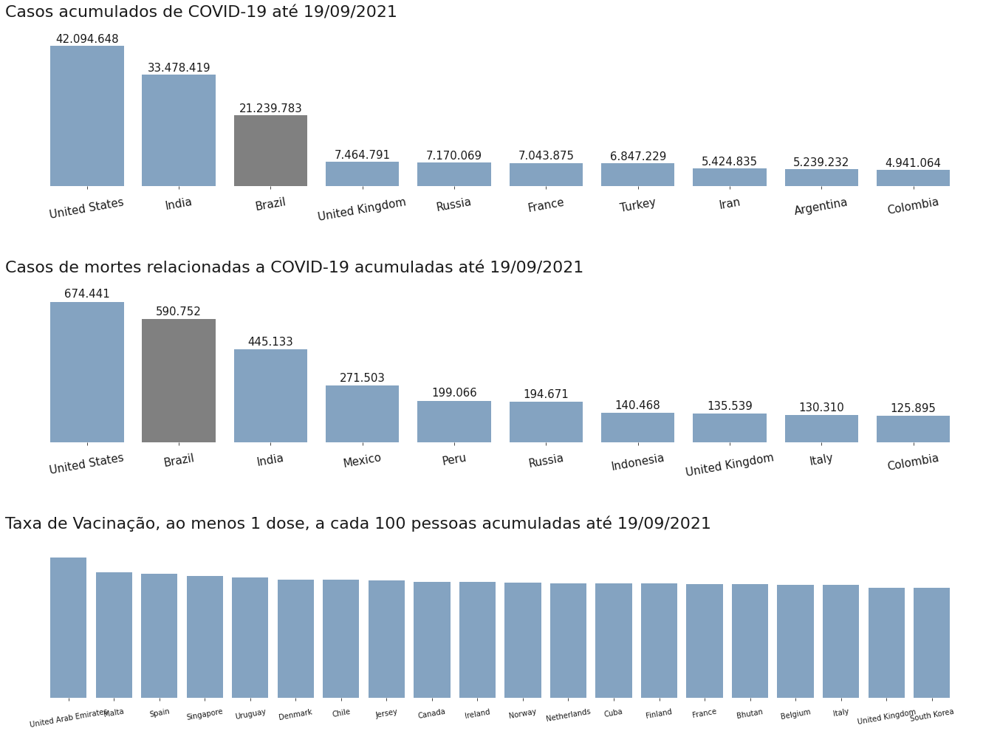

In [ ]:
#Avaliando os 10 paises tem mais casos acumulados
dia = '19/09/2021' # data mais atual que temos na base, conforme verificamos mais acima

#criando o figure e o ax no matplotlib
fig,ax = plt.subplots(figsize=(20,15),nrows=3,ncols=1)

#preparando os dados dos países com mais casos
df_paises_com_mais_casos = df_paises.loc['2021-09-19'][['location','total_cases']].sort_values(
    by='total_cases',ascending=False)[:10]

#preparando os dados dos países com mais mortes
df_paises_com_mais_mortes = df_paises.loc['2021-09-19'][['location','total_deaths']].sort_values(
    by='total_deaths',ascending=False)[:10]

#preparando os dados dos países com mais vacinas por 100 pessoas
df_paises_com_mais_vacinados = df_paises.loc['2021-09-19'][['location','people_vaccinated_per_hundred']].sort_values(
    by='people_vaccinated_per_hundred',ascending=False)[:20]


#ajustando os parâmetros para o primeiro gráfico
ax[0].bar(data=df_paises_com_mais_casos,x='location',height='total_cases',color=(0.2, 0.4, 0.6, 0.6))
ax[0].set_title('Casos acumulados de COVID-19 até ' + dia,loc='left',pad=30,fontdict={'fontsize':22})
ax[0].bar(data=df_paises_com_mais_casos[df_paises_com_mais_casos['location'] == 'Brazil'],x='location',height='total_cases',color='grey')
ax[0].tick_params(axis='x',labelsize=15,pad=10,rotation=10)

#colocando o rótulo de dados para o primeiro gráfico
addlabels(df_paises_com_mais_casos['location'],df_paises_com_mais_casos['total_cases'],0)

#retirando o eixo y e background de fundo
ax[0].set_frame_on(False)
ax[0].get_yaxis().set_visible(False)

#ajustando os parâmetros para o segundo gráfico
ax[1].bar(data=df_paises_com_mais_mortes,x='location',height='total_deaths',color=(0.2, 0.4, 0.6, 0.6))
ax[1].set_title('Casos de mortes relacionadas a COVID-19 acumuladas até '+ dia,loc='left',pad=30,fontdict={'fontsize':22,'Family':'Dejavu Sans'})
ax[1].bar(data=df_paises_com_mais_mortes[df_paises_com_mais_mortes['location'] == 'Brazil'],x='location',height='total_deaths',color='grey')
ax[1].tick_params(axis='x',labelsize=15,pad=10,rotation=10)

#colocando o rótulo de dados para o segundo gráfico
addlabels(df_paises_com_mais_mortes['location'],df_paises_com_mais_mortes['total_deaths'],1)

#retirando o eixo y e background de fundo
ax[1].get_yaxis().set_visible(False)
ax[1].set_frame_on(False)

#ajustando os parâmetros para o terceiro gráfico
ax[2].bar(data=df_paises_com_mais_vacinados,x='location',height='people_vaccinated_per_hundred', color=(0.2, 0.4, 0.6, 0.6))#,color='grey'
ax[2].set_title('Taxa de Vacinação, ao menos 1 dose, a cada 100 pessoas acumuladas até '+ dia,loc='left',pad=30,fontdict={'fontsize':22,'Family':'Dejavu Sans'})
ax[2].bar(data=df_paises_com_mais_vacinados[df_paises_com_mais_vacinados['location'] == 'Brazil'],x='location',height='people_vaccinated_per_hundred',color=(0.2, 0.4, 0.6, 0.6))
ax[2].tick_params(axis='x',labelsize=10,pad=10,rotation=10)

#retirando o eixo y e background de fundo
ax[2].get_yaxis().set_visible(False)
ax[2].set_frame_on(False)


#plotando os gráficos
plt.tight_layout(pad=5.0);

Interessante observar a ordens das localidades nos gráficos de **Casos** e **Mortes**, naturalmente as localidades que figuram nas primeiras posições em quantidade de ``casos``, também aparecem nas primeiras posições em quantidade de ``mortes``.

Já no quesito **Vacinação**, vemos ``localidades`` que não apareceram nas primeiras posições nos gráficos anteriores, ``localidades`` que focaram, a principio, nas médidas de isolamento e contenção do contagio do Covid-19, e agora estão mais adiantados na taxa de vacinação (por 100 pessoas)

Quando falou-se em **Pandemia** havia grande espectativa que os paises menos desenvolvidos teriam mais impactos na saúde e na econômia. Vamos observar se isso realmente se confirma.

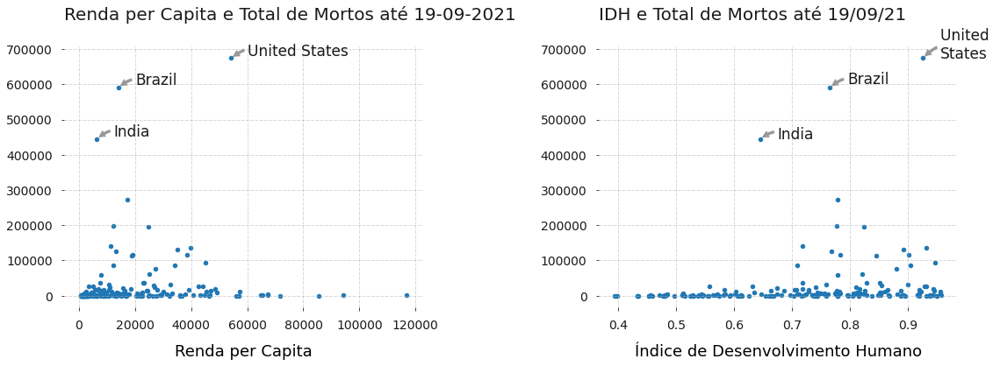

In [ ]:
#criando o figure e o ax no matplotlib
fig,ax = plt.subplots(figsize=(17,7),nrows=1,ncols=2)

#separando os valores para os três países com mais mortes
brazil = df_paises[df_paises['location'] == 'Brazil'].loc['2021-09-19']
usa = df_paises[df_paises['location'] == 'United States'].loc['2021-09-19']
india = df_paises[df_paises['location'] == 'India'].loc['2021-09-19']


#preparando o primeiro gráfico
df_paises.loc['2021-09-19'].plot.scatter(x='gdp_per_capita',y='total_deaths',ax=ax[0])
ax[0].set_xlabel('Renda per Capita',labelpad=14,fontdict={'fontsize':18})
ax[0].set_ylabel(None)
ax[0].set_title('Renda per Capita e Total de Mortos até 19-09-2021',loc='left',fontdict={'fontsize':20},pad=30)
ax[0].tick_params(axis='x',labelsize=14,pad=10)
ax[0].tick_params(axis='y',labelsize=14,pad=10)

#colocando a label para o Brazil no primeiro gráfico
x_brazil,y_brazil = brazil['gdp_per_capita'],brazil['total_deaths']
ax[0].annotate(fontsize=17,xy=(x_brazil,y_brazil),xytext=(x_brazil+6000,y_brazil+8000), arrowprops=dict(arrowstyle="simple",
                            fc="0.6", ec="none",
                            connectionstyle="arc3,rad=0.3"),s='Brazil')

#colocando a label para os Estados unidos no primeiro gráfico
x_usa,y_usa = usa['gdp_per_capita'],usa['total_deaths']
ax[0].annotate(fontsize=17,xy=(x_usa,y_usa),xytext=(x_usa+6000,y_usa+8000), arrowprops=dict(arrowstyle="simple",
                            fc="0.6", ec="none",
                            connectionstyle="arc3,rad=0.3"),s='United States')

#colocando a label para a India no primeiro gráfico
x_india,y_india = india['gdp_per_capita'],india['total_deaths']
ax[0].annotate(fontsize=17,xy=(x_india,y_india),xytext=(x_india+6000,y_india+8000), arrowprops=dict(arrowstyle="simple",
                            fc="0.6", ec="none",
                            connectionstyle="arc3,rad=0.3"),s='India')

#ajustando o grid do primeiro gráfico
ax[0].grid(linestyle='-.',lw=0.5,aa=True)
ax[0].set_frame_on(False)


#preparando o segundo gráfico
df_paises.loc['2021-09-19'].plot.scatter(x='human_development_index',y='total_deaths',ax=ax[1])
ax[1].set_xlabel('Índice de Desenvolvimento Humano',labelpad=14,fontdict={'fontsize':18})
ax[1].set_ylabel(None)
ax[1].set_title('IDH e Total de Mortos até 19/09/21',loc='left',fontdict={'fontsize':20},pad=30)
ax[1].tick_params(axis='x',labelsize=14,pad=10)
ax[1].tick_params(axis='y',labelsize=14,pad=10)

#colocando a label para o Brazil no segundo gráfico
x_brazil,y_brazil = brazil['human_development_index'],brazil['total_deaths']
ax[1].annotate(fontsize=17,xy=(x_brazil,y_brazil),xytext=(x_brazil+0.03,y_brazil+10000), arrowprops=dict(arrowstyle="simple",
                            fc="0.6", ec="none",
                            connectionstyle="arc3,rad=0.3"),s='Brazil')

#colocando a label para os Estados unidos no segundo gráfico
x_usa,y_usa = usa['human_development_index'],usa['total_deaths']
ax[1].annotate(fontsize=17,xy=(x_usa,y_usa),xytext=(x_usa+0.03,y_usa+200), arrowprops=dict(arrowstyle="simple",
                            fc="0.6", ec="none",
                            connectionstyle="arc3,rad=0.3"),s='United \nStates')

#colocando a label para a India no primeiro gráfico
x_india,y_india = india['human_development_index'],india['total_deaths']
ax[1].annotate(fontsize=17,xy=(x_india,y_india),xytext=(x_india+0.03,y_india+800), arrowprops=dict(arrowstyle="simple",
                            fc="0.6", ec="none",
                            connectionstyle="arc3,rad=0.3"),s='India')

#ajustando o grid do segundo gráfico
ax[1].grid(linestyle='-.',lw=0.5,aa=True)
ax[1].set_frame_on(False)

#plotando os gráficos
plt.tight_layout(pad=5.0);

In [ ]:
df_paises.loc['2021-09-19'][['location','gdp_per_capita']].sort_values(ascending=False, by='gdp_per_capita')[:85].tail(1)

,location,gdp_per_capita
date,,
2021-09-19,Brazil,14103.452


Obviamente o efeito da Pandemia é mundial e sem prescendentes, mas analisando os gráficos acima temos cenários curiosos.

**Estados Unidos**, **Brasil** e **India** estão com cenários semelhantes em numeros de *mortos* na pandemia, até o momento, mas possuem cenários distintos econômicamente. Não quer dizer que a recuperação e ou os impactos futuros possam ser iguais para ambos, mas evidencia o enfrentamento semelhante dos mesmos para a pandemia, mesmo em cenários diferentes econômicamente falando.

Ao olharmos a *Renda Per Capita*, o Brasil por exemplo, ocupa a posição 86º, e esta em 2º lugar no numero de mortos, India por sua vez, esta mais abaixo do Brasil neste ranking, diferentemente dos EUA que ocupa o topo no número de mortes e figura nas primerias posições no ranking de Renda per Capta.

Cenário bem parecido com o de *IDH*. O fato é que os efeitos da pandemia no quesito de mortes, não esta, até o momento, diretamente ligado a econômia, mas sim a forma como o paises lidaram com a mesma, vamos plotar uma correlação para tentar identificarmos isso.

In [ ]:
df_corr = df_paises.select_dtypes(exclude=['object'])
df_corr.fillna(value=0, inplace=True)

In [ ]:
df_corr.shape

(115519, 60)

In [ ]:
# Mesmo excluindo as colunas com o tipo objeto, ainda ficamos com muitas variáveis para correlacionar, vamos pegar as que mais estamos usando e as que podemos usar no futuro
df_corr = df_corr[['total_cases','total_deaths','reproduction_rate','icu_patients','hosp_patients','total_tests',
                                                 'positive_rate','total_vaccinations','people_vaccinated','people_fully_vaccinated',
                                                 'total_boosters','stringency_index','median_age','gdp_per_capita','extreme_poverty',
                                                 'male_smokers','female_smokers','handwashing_facilities','human_development_index','aged_70_older',
                                                 'diabetes_prevalence','cardiovasc_death_rate']]

In [ ]:
df_corr.shape

(115519, 22)

In [ ]:
df_corr = df_corr.corr()

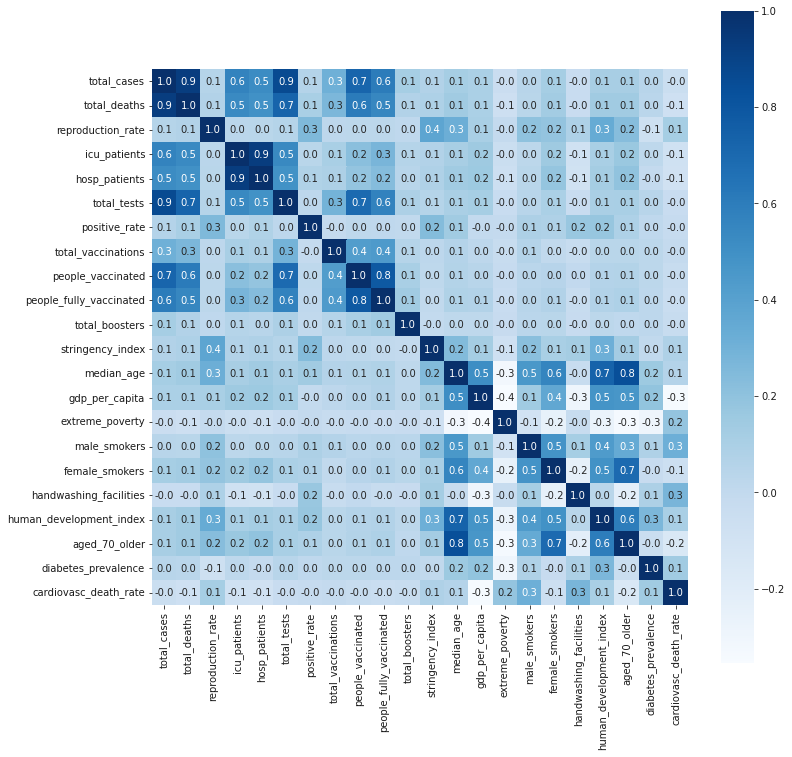

In [ ]:
fig,ax = plt.subplots(figsize=(12,12))
ax = sns.heatmap(df_corr,square=True,cmap='Blues',annot=True,fmt='.1f')

Podemos observar que as maiores *correlações* analisando **Total de Casos e mortes** são com as variáveis referentes a internções, UTI´s etc. e com variáveis de ações preventivas, testes e vacinação.

Interessante observar como a correlação á *alta* para ambas as variáveis (Casos e Mortes) com *Testes de Covid*.

### Deep dive Brasil

In [ ]:
df_br = df_paises.loc[df_paises.location == 'Brazil']

In [ ]:
df_br.head(2)

,iso_code,continent,location,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-26,BRA,South America,Brazil,1.0,1.0,NaN,NaN,NaN,NaN,0.005,0.005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,213993441.0,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,8.11,10.1,17.9,NaN,2.2,75.88,0.765,NaN,NaN,NaN,NaN
2020-02-27,BRA,South America,Brazil,1.0,0.0,NaN,NaN,NaN,NaN,0.005,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.56,213993441.0,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,8.11,10.1,17.9,NaN,2.2,75.88,0.765,NaN,NaN,NaN,NaN


Infelizmente este dataset não possui uma visão de UF e cidades, vamos replicar algumas analises para o Brasil, entendendo o cenário atual

Dados até 19-09-2021:

Total de Casos: 21.239.783
Total de Mortes: 590.752
Total de Vacinados: 80.507.122
% população: 38%


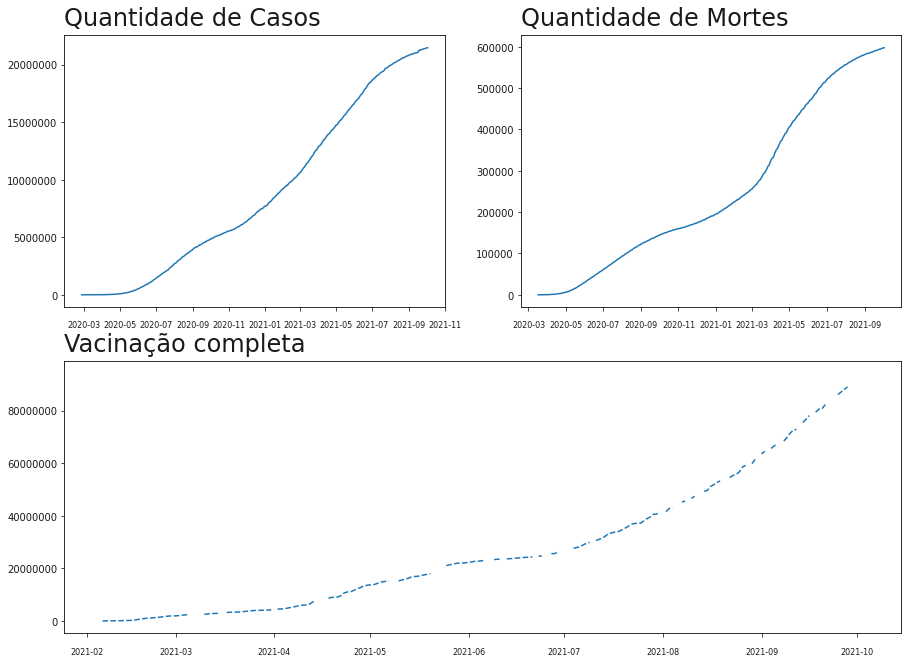

In [ ]:
#Grid
gridsize=(3,2)
fig = plt.figure(figsize=(15,17))

# as posições são semelhantes a uma lista, iniciando no 0
ax1 = plt.subplot2grid(gridsize, (0, 0)) 
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0), colspan=2, rowspan=1)

#Primeiro Gráfico
ax1.plot(df_br.total_cases)
ax1.set_title('Quantidade de Casos',loc='left',pad=10,fontdict={'fontsize':24})
ax1.tick_params(axis='x',labelsize=8,pad=10)
ax1.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

#Segundo Gráfico
ax2.plot(df_br.total_deaths)
ax2.set_title('Quantidade de Mortes',loc='left',pad=10,fontdict={'fontsize':24})
ax2.tick_params(axis='x',labelsize=8,pad=10)
ax2.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

#Terceiro Gráfico
ax3.plot(df_br.people_fully_vaccinated, linestyle='--')
ax3.set_title('Vacinação completa',loc='left',pad=10,fontdict={'fontsize':24})
ax3.tick_params(axis='x',labelsize=8,pad=10)
ax3.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

print('Dados até 19-09-2021:\n')
print('Total de Casos: {:,}'.format(int(df_br.total_cases.loc['2021-09-19'])).replace(',','.'))
print('Total de Mortes: {:,}'.format(int(df_br.total_deaths.loc['2021-09-19'])).replace(',','.'))
print('Total de Vacinados: {:,}'.format(int(df_br.people_fully_vaccinated.loc['2021-09-19'])).replace(',','.'))
print('% população: {0:.0f}%'.format(df_br.people_fully_vaccinated.loc['2021-09-19']/df_br.population.loc['2021-09-19']*100))

Conforme observamos na analise Global dos dados, o Brasil esta na **3º posição** em total de **casos** e em **2º no total** de **mortos** pela Covid-19.

Estamos avançando bem na vacinação, estamos com quase **40%** da população com a **vacinação completa**, que já esta refletindo, e muito, nos numeros de novos casos e mortes, como veremos nas analises abaixo.



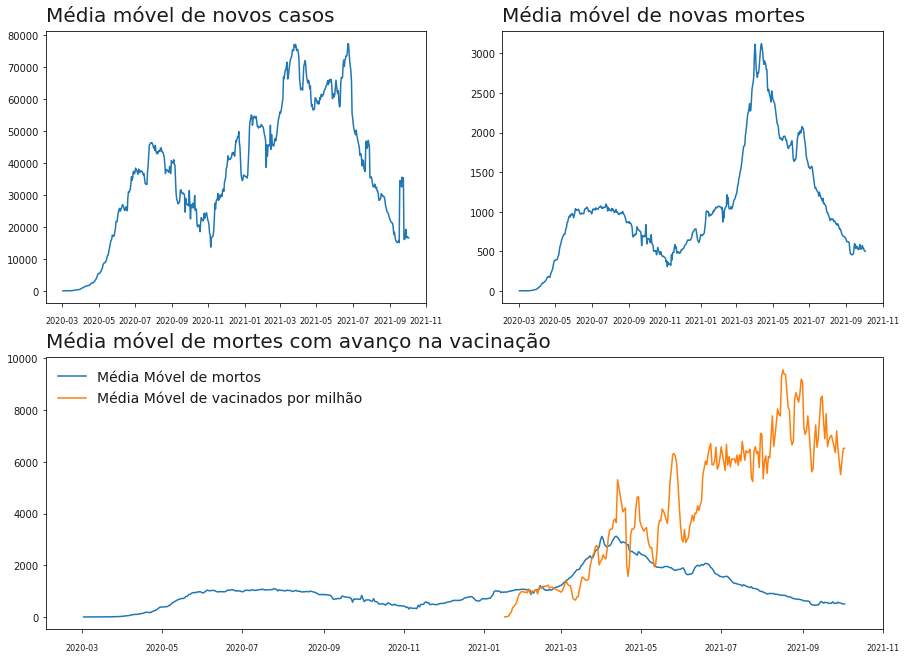

In [ ]:
#Grid
gridsize=(3,2)
fig = plt.figure(figsize=(15,17))

# as posições são semelhantes a uma lista, iniciando no 0
ax1 = plt.subplot2grid(gridsize, (0, 0)) 
ax2 = plt.subplot2grid(gridsize, (0, 1))
ax3 = plt.subplot2grid(gridsize, (1, 0), colspan=2, rowspan=1)

#Primeiro Gráfico
ax1.plot(df_br.new_cases_smoothed)
ax1.set_title('Média móvel de novos casos',loc='left',pad=10,fontdict={'fontsize':20})
ax1.tick_params(axis='x',labelsize=8,pad=10)
ax1.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

#Segundo Gráfico
ax2.plot(df_br.new_deaths_smoothed)
ax2.set_title('Média móvel de novas mortes',loc='left',pad=10,fontdict={'fontsize':20})
ax2.tick_params(axis='x',labelsize=8,pad=10)
ax2.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

#Terceiro Gráfico
ax3.plot(df_br.new_deaths_smoothed)
ax3.plot(df_br.new_vaccinations_smoothed_per_million)
ax3.set_title('Média móvel de mortes com avanço na vacinação',loc='left',pad=10,fontdict={'fontsize':20})
ax3.legend(['Média Móvel de mortos','Média Móvel de vacinados por milhão'],frameon=False,fontsize=14,loc='top')
ax3.tick_params(axis='x',labelsize=8,pad=10)
ax3.yaxis.set_major_formatter(ticker.FormatStrFormatter('%d'))

## Conclusão

Não à dúvidas que a COVID-19 gerou uma crise mundial sem precedentes, afetando a econômia, educação, saúde, comportamento social, psicologico, perdas ( ``LUTO`` até mesmo a ausencia dele), e diversas outras frentes desta cadeia de impactos que não conseguiria descrever.


De uma coisa tenho certeza, ficará para a história, assim como a pandemia de 1920.

Ficará na história a rapidez da ciência, em dar uma resposta, um norte para a criação de uma vacina em tempo recorde, mesmo com a descrença pelo curto espaço de tempo. 

Ficará na história os gestos de inclusão e solidariedade dos povos, as crises politicas mundiais em virtude da mesma, assim como os planos para a retomada da **VIDA**

A pandemia do Covid-19, que ultrapassou 2020 e boa parte de 2021 e quem sabe ate quando irá estar presente, de forma atuante entre nós, abriu as faces do mundo, para o lado bom, do bem, mas também nos mostrou uma face nebulosa, egocentrica, que sempre esteve presente mas nunca antes escancarada, jogada na cara da sociedade. 

Ainda teremos surpresas, acredito que sim, consequências ainda não descobertas, estudos ainda em seu inicio, muita coisa só o tempo ajudará com as respostas ou previsões. Mas estaremos mais calejados e encorajados a agir.